<img src="https://raw.githubusercontent.com/UXARRAY/uxarray/main/docs/_static/images/logos/uxarray_logo_h_dark.svg"
     width="30%"
     alt="HEALPix logo"
     align="right"
/>

# UXarray for Basic HEALPix Statistics & Visualization

### In this section, you'll learn:

* Utilizing intake to open a HEALPix data catalog
* Using the `uxarray` package to look at basic statistics over HEALPix data
* Using UXarray plotting functionality on HEALPix data

### Related Documentation

* [UXarray homepage](https://uxarray.readthedocs.io/en/latest/index.html)
* [Working with HEALPix data - UXarray documentation](https://uxarray.readthedocs.io/en/latest/user-guide/healpix.html)
* [UXarray overview - Unstructured Grids Visualization Cookbook](https://projectpythia.org/unstructured-grid-viz-cookbook/notebooks/02-intro-to-uxarray/overview.html)
* [Data visualization with UXarray - Unstructured Grids Visualization Cookbook](https://projectpythia.org/unstructured-grid-viz-cookbook/notebooks/03-plotting-with-uxarray/data-viz.html)
* [Subsetting - UXarray documentation](https://uxarray.readthedocs.io/en/latest/user-guide/subset.html)
* [Intake Cookbook](https://projectpythia.org/intake-cookbook/README.html)

### Prerequisites

| Concepts | Importance | Notes |
| --- | --- | --- |
| [UXarray](https://uxarray.readthedocs.io/en/latest/index.html) | Necessary  | |
| [HEALPix overview](00-healpix) | Necessary  | |

**Time to learn**: 30 minutes

-----

In [1]:
import uxarray as ux
import cartopy.crs as ccrs

## Open data catalog

:::{tip} If you think you first need to learn about Intake, Pythia's [Intake Cookbook](https://projectpythia.org/intake-cookbook/README.html) is a great resource to do so.:::

:::{tip} Also, if you want to get insights into the particular HEALPix data catalog we will use throughout this section, please be sure to check the previous section first, [easy.gems for HEALPix Analysis & Visualization](01-easygems):::

In [2]:
import intake

cat = intake.open_catalog("https://data.nextgems-h2020.eu/online.yaml")
model_run = cat.ICON.ngc3028

ds_coarsest = model_run().to_dask()
ds_fine = model_run(zoom=7).to_dask()

/Users/oero/miniconda3/envs/healpix-cookbook-dev/lib/python3.13/site-packages/intake_xarray/base.py:21: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  'dims': dict(self._ds.dims),
/Users/oero/miniconda3/envs/healpix-cookbook-dev/lib/python3.13/site-packages/intake_xarray/base.py:21: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  'dims': dict(self._ds.dims),


In [3]:
uxds_coarsest = ux.UxDataset.from_healpix(ds_coarsest)

uxds_fine = ux.UxDataset.from_healpix(ds_fine)
uxds_fine

<xarray.UxDataset> Size: 2TB
Dimensions:                              (time: 1350, depth_half: 129,
                                          n_face: 196608, level_full: 90,
                                          crs: 1, depth_full: 128,
                                          soil_depth_water_level: 5,
                                          level_half: 91,
                                          soil_depth_energy_level: 5)
Coordinates:
  * crs                                  (crs) float32 4B nan
  * depth_full                           (depth_full) float32 512B 1.0 ... 5....
  * depth_half                           (depth_half) float32 516B 0.0 ... 6....
  * level_full                           (level_full) int32 360B 1 2 3 ... 89 90
  * level_half                           (level_half) int32 364B 1 2 3 ... 90 91
  * soil_depth_energy_level              (soil_depth_energy_level) float32 20B ...
  * soil_depth_water_level               (soil_depth_water_level) float32 20B ...
  * time                                 (time) datetime64[ns] 11kB 2020-01-2...
Dimensions without coordinates: n_face
Data variables: (12/88)
    a_tracer_v_to                        (time, depth_half, n_face) float32 137GB ...
    atmos_fluxes_frshflux_evaporation    (time, n_face) float32 1GB ...
    atmos_fluxes_frshflux_precipitation  (time, n_face) float32 1GB ...
    atmos_fluxes_frshflux_runoff         (time, n_face) float32 1GB ...
    atmos_fluxes_frshflux_snowfall       (time, n_face) float32 1GB ...
    atmos_fluxes_heatflux_latent         (time, n_face) float32 1GB ...
    ...                                   ...
    va                                   (time, level_full, n_face) float32 96GB ...
    vas                                  (time, n_face) float32 1GB ...
    w                                    (time, depth_half, n_face) float32 137GB ...
    wa_phy                               (time, level_half, n_face) float32 97GB ...
    wind_speed_10m                       (time, n_face) float32 1GB ...
    zos                                  (time, n_face) float32 1GB ...

## HEALPix basic stats using UXarray

In [4]:
import matplotlib.pylab as plt

boulder_lon = -105.2747
boulder_lat = 40.0190

### Mesh face containing Boulder's coords

In [5]:
%%time
boulder_face = uxds_fine.uxgrid.get_faces_containing_point(point_lonlat=[boulder_lon, boulder_lat])

CPU times: user 263 ms, sys: 66.2 ms, total: 329 ms
Wall time: 203 ms


### Global and Boulder's temperature averages

In order to get a line plot out of our `UXarray.UxDataset` objects' 1-dimensional temperature variables, we will convert them to `xarray` and call the default `plot` function because UXarray's default plot functions are all dedicated to grid-topology based visualizations:

CPU times: user 4.32 s, sys: 1.02 s, total: 5.34 s
Wall time: 21.5 s


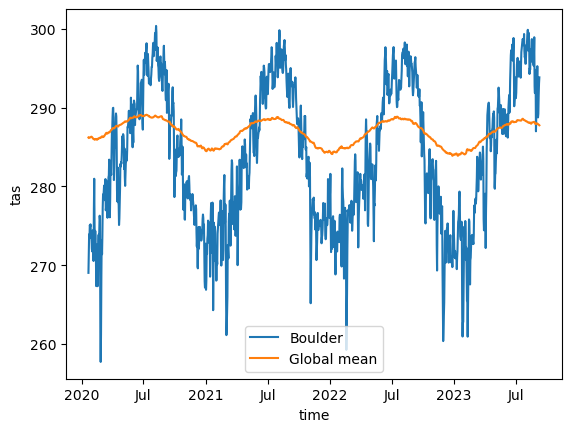

In [6]:
%%time
uxds_fine.tas.isel(n_face=boulder_face).to_xarray().plot(label="Boulder")
uxds_coarsest.tas.mean("n_face").to_xarray().plot(label="Global mean")

plt.legend()

## Data plotting with UXarray

UXarray provides several built-in plotting functions to visualize unstructured grids, which can also be applied to HEALPix grids in the same interface:

Let us first look into interactive plots with `bokeh` backend (i.e. UXarray's plotting functions have a `backend` parameter that defaults to "bokeh", and it can also accept "matplotlib")

### Global plots

In [7]:
%%time

projection = ccrs.Robinson(central_longitude=-135.5808361)

uxds_fine["tas"].isel(time=0).plot(
    projection=projection,
    cmap="inferno",
    features=["borders", "coastline"],
    title="Global temperature",
    width=700,
)

CPU times: user 1.59 s, sys: 88.9 ms, total: 1.68 s
Wall time: 4.59 s


:Overlay
   .Image.I     :Image   [Longitude,Latitude]   (Longitude_Latitude tas)
   .Coastline.I :Feature   [Longitude,Latitude]
   .Borders.I   :Feature   [Longitude,Latitude]

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

CPU times: user 391 ms, sys: 16.1 ms, total: 407 ms
Wall time: 1.73 s


:Overlay
   .Image.I     :Image   [Longitude,Latitude]   (Longitude_Latitude tas)
   .Coastline.I :Feature   [Longitude,Latitude]
   .Borders.I   :Feature   [Longitude,Latitude]
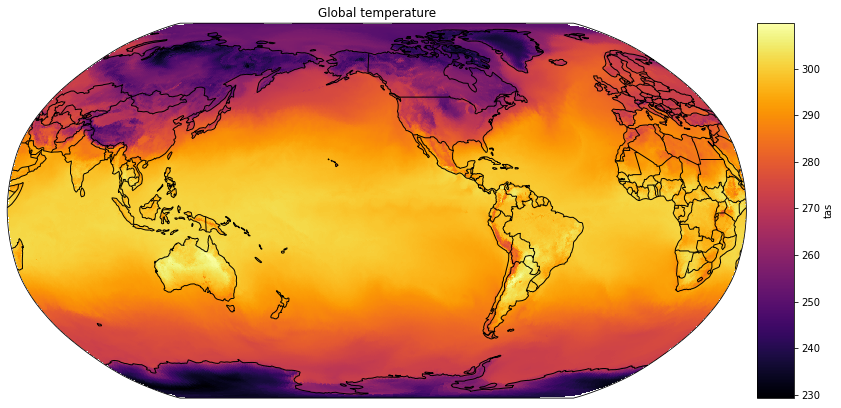

In [8]:
%%time

uxds_fine["tas"].isel(time=0).plot(
    backend="matplotlib",
    projection=projection,
    cmap="inferno",
    features=["borders", "coastline"],
    title="Global temperature",
    width=1100,
)

### Regional subsets (Not only for plotting but also for analysis)

When a region on the globe is of interest, UXarray provides subsetting functions, which return new regional grids that can then be used in the same way a global grid is plotted. 

Let us look into USA map using the Boulder, CO, USA coords we had used before for simplicity:

Subsetting `uxds_fine` into a new `UxDataset` using a "bounding box" around Boulder, CO first:

In [9]:
%%time

lon_bounds = (boulder_lon-20, boulder_lon+40)
lat_bounds = (boulder_lat-20, boulder_lat+12)

uxds_fine_subset = uxds_fine["tas"].isel(time=0).subset.bounding_box(
    lon_bounds, 
    lat_bounds
    )

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


CPU times: user 2.91 s, sys: 12 ms, total: 2.92 s
Wall time: 351 ms


If we quick check the global and regional subset's average temperature at the first time-step, we can see the difference:

In [10]:
print("Regional subset's temperature average: ", uxds_fine_subset.mean("n_face").values, " K")
print("Global temperature average: ", uxds_fine.tas.mean("n_face").isel(time=0).values, " K")

Regional subset's temperature average:  278.97748  K
Global temperature average:  286.2222  K


Now, let us plot the regional subset `UxDataset`:

CPU times: user 74.8 ms, sys: 14.2 ms, total: 89 ms
Wall time: 84.8 ms


:Overlay
   .Image.I     :Image   [Longitude,Latitude]   (Longitude_Latitude tas)
   .Coastline.I :Feature   [Longitude,Latitude]
   .Borders.I   :Feature   [Longitude,Latitude]
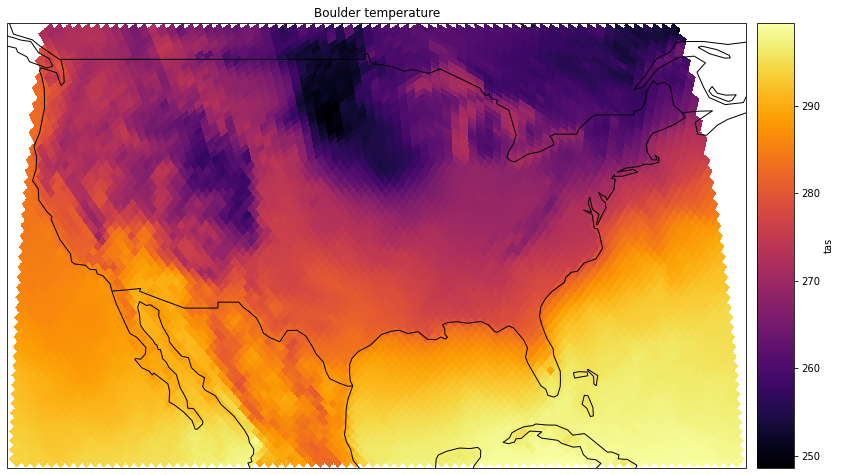

In [11]:
%%time 
projection = ccrs.Robinson(central_longitude=boulder_lon)

uxds_fine_subset.plot(
    projection=projection,
    cmap="inferno",
    features=["borders", "coastline"],
    title="Boulder temperature",
    width=1100,
)

## Grid topology exploration

Exploring the grid topology may be needed sometimes, and UXarray provides functionality to do so, both numerically and visually. Each `UxDataset` or `UxDataArray` has their associated `Grid` object that has all the information such as spherical and cartesian coordinates, connectivities, dimensions, etc. about the topology this data belongs to. This `Grid` object can be explored as follows: 

In [12]:
uxds_fine.uxgrid

<uxarray.Grid>
Original Grid Type: HEALPix
Grid Dimensions:
  * n_node: 196610
  * n_face: 196608
  * n_max_face_nodes: 4
Grid Coordinates (Spherical):
  * node_lon: (196610,)
  * node_lat: (196610,)
  * face_lon: (196608,)
  * face_lat: (196608,)
Grid Coordinates (Cartesian):
  * node_x: (196610,)
  * node_y: (196610,)
  * node_z: (196610,)
Grid Connectivity Variables:
  * face_node_connectivity: (196608, 4)
Grid Descriptor Variables:
  * n_nodes_per_face: (196608,)

There might be times that the user wants to open a standalone `Grid` object for a HEALPix grid (or any other unstructured grids supported by UXarray) without accessing the data yet, which can also be achieved as follows:

In [13]:
# Let us open a pretty coarse HEALPix grid because we will visualize it later
uxgrid = ux.Grid.from_healpix(zoom=3, pixels_only=False)
uxgrid

<uxarray.Grid>
Original Grid Type: HEALPix
Grid Dimensions:
  * n_node: 770
  * n_face: 768
  * n_max_face_nodes: 4
Grid Coordinates (Spherical):
  * node_lon: (770,)
  * node_lat: (770,)
  * face_lon: (768,)
  * face_lat: (768,)
Grid Coordinates (Cartesian):
Grid Connectivity Variables:
  * face_node_connectivity: (768, 4)
Grid Descriptor Variables:

:Path   [Longitude,Latitude]
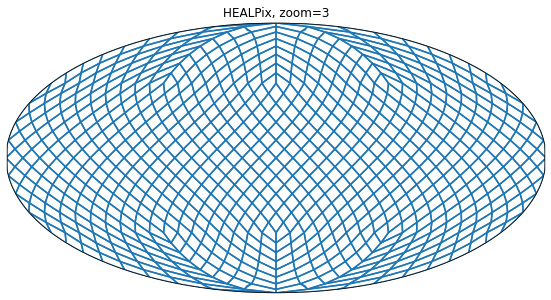

In [15]:
uxgrid.plot(
    periodic_elements="split",         
    projection=ccrs.Mollweide(),
    width=800,
    title="HEALPix, zoom=3")